# Medical MNIST — AE & VAE

## 1. Mounting Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 2. Unzipping Data

In [2]:
import os, zipfile

ZIP_PATH = '/content/drive/MyDrive/medical_mnist/medical_mnist.zip'
EXTRACT_TO = '/content/medical_mnist'

if not os.path.exists(EXTRACT_TO):
    with zipfile.ZipFile(ZIP_PATH, 'r') as z:
        z.extractall(EXTRACT_TO)
    print('Extracted to', EXTRACT_TO)
else:
    print('Already extracted')

!ls {EXTRACT_TO}

Already extracted
AbdomenCT  BreastMRI  ChestCT  CXR  Hand  HeadCT


## 3. Cloning the project from GitHub and importing modules

In [3]:
!rm -rf /content/project
!git clone https://github.com/Nada1541/Representation-Learning-with-AE-VAE.git /content/project

import sys
sys.path.append('/content/project')

import config
from data import make_region_datasets
from models import Autoencoder, VAE
from training import train_ae, train_vae
from utils import (
    plot_reconstructions, plot_latent_space, plot_generated_samples,
    plot_loss_history, plot_denoising,
)

import os
import tensorflow as tf
print('TF:', tf.__version__, '| GPU:', tf.config.list_physical_devices('GPU'))

Cloning into '/content/project'...
remote: Enumerating objects: 36, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 36 (delta 10), reused 35 (delta 9), pack-reused 0 (from 0)
Receiving objects: 100% (36/36), 6.67 KiB | 6.67 MiB/s, done.
Resolving deltas: 100% (10/10), done.
TF: 2.19.0 | GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## 4. paths and hyperparameters

In [4]:
config.DATA_ROOT = '/content/medical_mnist'
config.OUTPUT_DIR = '/content/drive/MyDrive/medical_mnist_outputs'
config.EPOCHS = 20
config.BATCH_SIZE = 128
config.LATENT_DIM = 16
config.KL_WEIGHT = 1.0

import os
os.makedirs(config.OUTPUT_DIR, exist_ok=True)
os.makedirs(os.path.join(config.OUTPUT_DIR, 'checkpoints'), exist_ok=True)
print('Regions:', config.REGIONS)

Regions: ['AbdomenCT', 'BreastMRI', 'ChestCT', 'CXR', 'Hand', 'HeadCT']


## 5. Sanity check

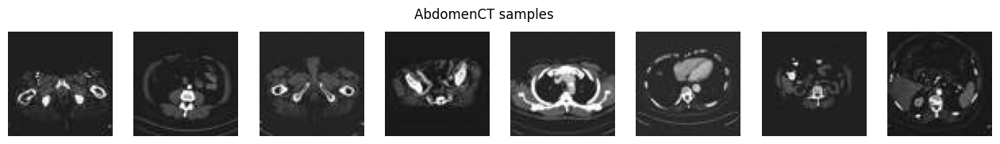

In [5]:
import matplotlib.pyplot as plt

demo_train, _ = make_region_datasets(
    config.DATA_ROOT, config.REGIONS[0],
    image_size=config.IMAGE_SIZE, channels=config.CHANNELS,
    batch_size=8, val_split=config.VAL_SPLIT, seed=config.SEED,
)
for x, _ in demo_train.take(1):
    fig, ax = plt.subplots(1, 8, figsize=(16, 2))
    for i in range(8):
        ax[i].imshow(x[i].numpy().squeeze(), cmap='gray')
        ax[i].axis('off')
    fig.suptitle(f'{config.REGIONS[0]} samples')
    plt.show()

## 6. Train AE and VAE for every region

In [6]:
results = {}

def train_and_visualize(region):
    """Train AE + VAE for one region and produce all visualizations."""
    print(f'\n========== {region} ==========')
    train_ds, val_ds = make_region_datasets(
        config.DATA_ROOT, region,
        image_size=config.IMAGE_SIZE, channels=config.CHANNELS,
        batch_size=config.BATCH_SIZE, val_split=config.VAL_SPLIT,
        seed=config.SEED,
    )

    print(f'[{region}] training AE ...')
    ae = Autoencoder(
        input_shape=(config.IMAGE_SIZE, config.IMAGE_SIZE, config.CHANNELS),
        latent_dim=config.LATENT_DIM,
    )
    ae_path = os.path.join(config.OUTPUT_DIR, 'checkpoints', f'ae_{region}.weights.h5')
    ae_history = train_ae(ae, train_ds, val_ds,
                          epochs=config.EPOCHS, lr=config.LEARNING_RATE,
                          save_path=ae_path)

    print(f'[{region}] training VAE ...')
    vae = VAE(
        input_shape=(config.IMAGE_SIZE, config.IMAGE_SIZE, config.CHANNELS),
        latent_dim=config.LATENT_DIM,
        kl_weight=config.KL_WEIGHT,
    )
    vae_path = os.path.join(config.OUTPUT_DIR, 'checkpoints', f'vae_{region}.weights.h5')
    vae_history = train_vae(vae, train_ds, val_ds,
                            epochs=config.EPOCHS, lr=config.LEARNING_RATE,
                            save_path=vae_path)

    results[region] = {
        'ae_val_loss':   ae_history.history.get('val_loss', [None])[-1],
        'vae_val_loss':  vae_history.history.get('val_loss', [None])[-1],
        'vae_val_recon': vae_history.history.get('val_recon_loss', [None])[-1],
        'vae_val_kl':    vae_history.history.get('val_kl_loss', [None])[-1],
    }

    plot_loss_history(ae_history,  title=f'{region} — AE loss')
    plot_loss_history(vae_history, title=f'{region} — VAE loss')
    plot_reconstructions(ae,  val_ds, title=f'{region} — AE reconstructions')
    plot_reconstructions(vae, val_ds, title=f'{region} — VAE reconstructions')
    plot_latent_space(ae,  val_ds, title=f'{region} — AE latent (PCA)')
    plot_latent_space(vae, val_ds, title=f'{region} — VAE latent (PCA)')
    plot_generated_samples(vae, n=16, title=f'{region} — VAE samples')
    plot_denoising(ae,  val_ds, title=f'{region} — AE denoising')
    plot_denoising(vae, val_ds, title=f'{region} — VAE denoising')

    return ae, vae

### Region 1 — AbdomenCT


========== AbdomenCT ==========
[AbdomenCT] training AE ...
Epoch 1/20
63/63 - 16s - 250ms/step - loss: 0.6843 - val_loss: 0.6804
Epoch 2/20
63/63 - 2s - 32ms/step - loss: 0.6784 - val_loss: 0.6761
Epoch 3/20
63/63 - 2s - 31ms/step - loss: 0.6747 - val_loss: 0.6738
Epoch 4/20
63/63 - 2s - 32ms/step - loss: 0.6730 - val_loss: 0.6725
Epoch 5/20
63/63 - 2s - 39ms/step - loss: 0.6719 - val_loss: 0.6717
Epoch 6/20
63/63 - 2s - 34ms/step - loss: 0.6711 - val_loss: 0.6709
Epoch 7/20
63/63 - 2s - 33ms/step - loss: 0.6704 - val_loss: 0.6703
Epoch 8/20
63/63 - 2s - 32ms/step - loss: 0.6698 - val_loss: 0.6700
Epoch 9/20
63/63 - 2s - 32ms/step - loss: 0.6696 - val_loss: 0.6694
Epoch 10/20
63/63 - 2s - 32ms/step - loss: 0.6690 - val_loss: 0.6691
Epoch 11/20
63/63 - 2s - 39ms/step - loss: 0.6687 - val_loss: 0.6688
Epoch 12/20
63/63 - 3s - 40ms/step - loss: 0.6684 - val_loss: 0.6686
Epoch 13/20
63/63 - 2s - 33ms/step - loss: 0.6681 - val_loss: 0.6685
Epoch 14/20
63/63 - 2s - 32ms/step - loss: 0.6679

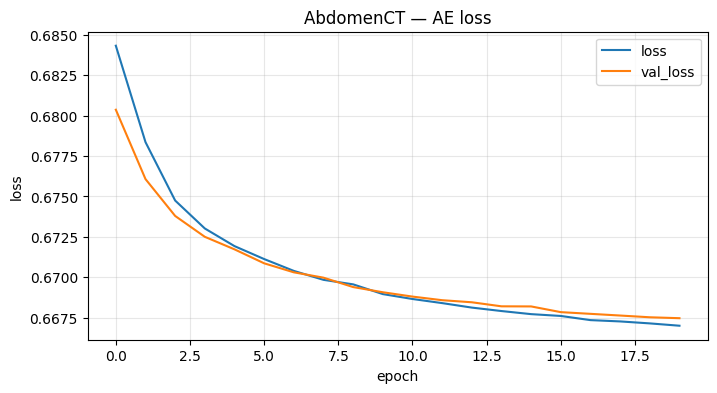

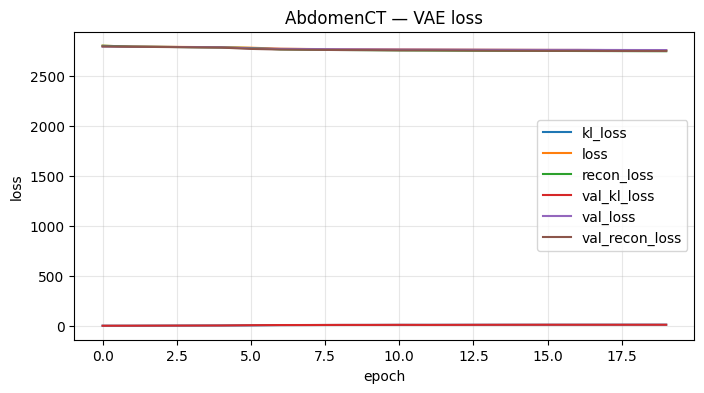

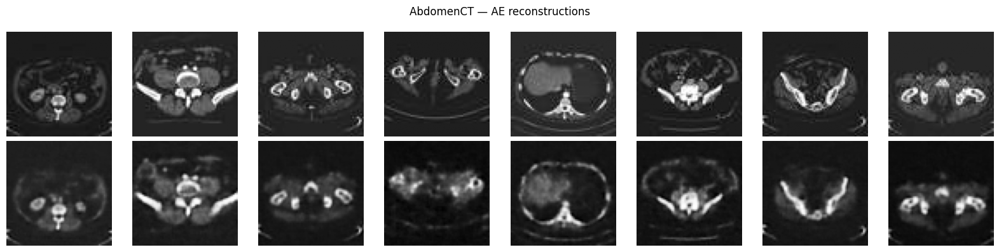

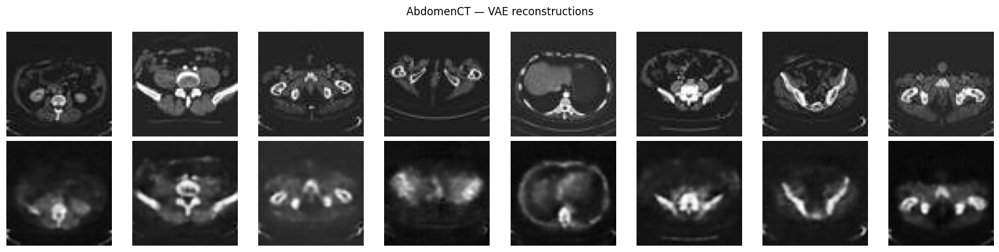

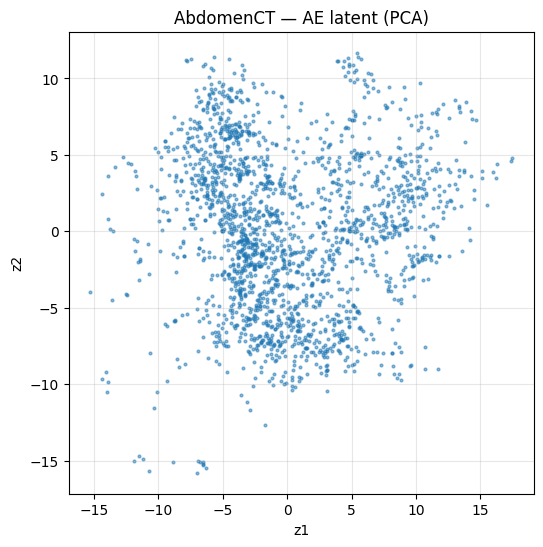

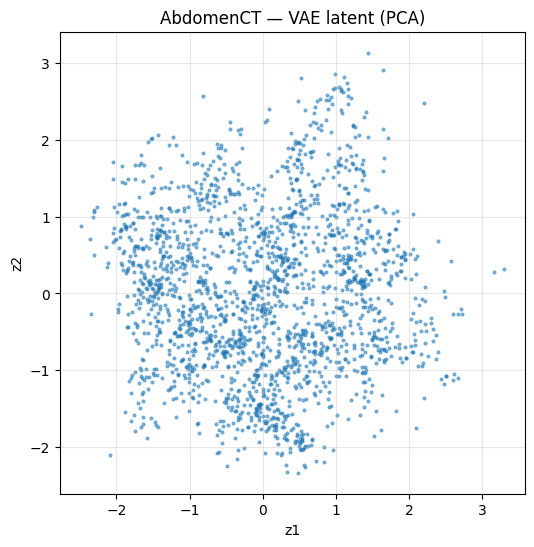

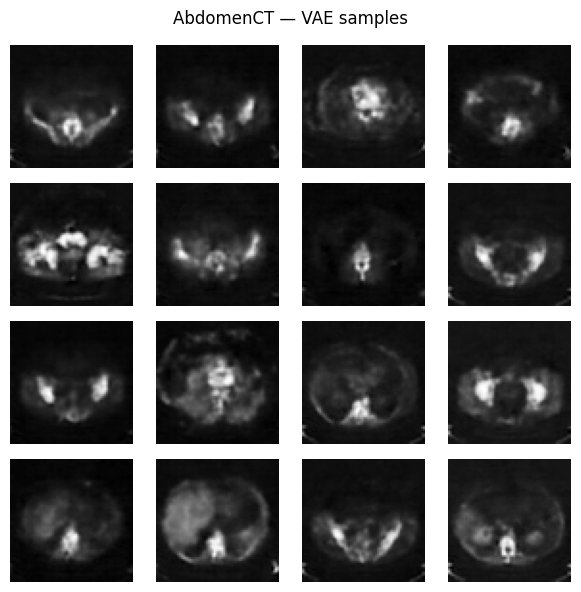

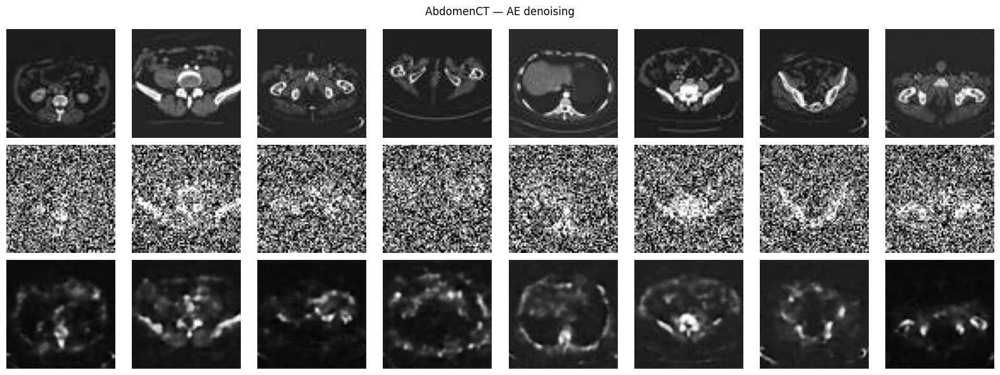

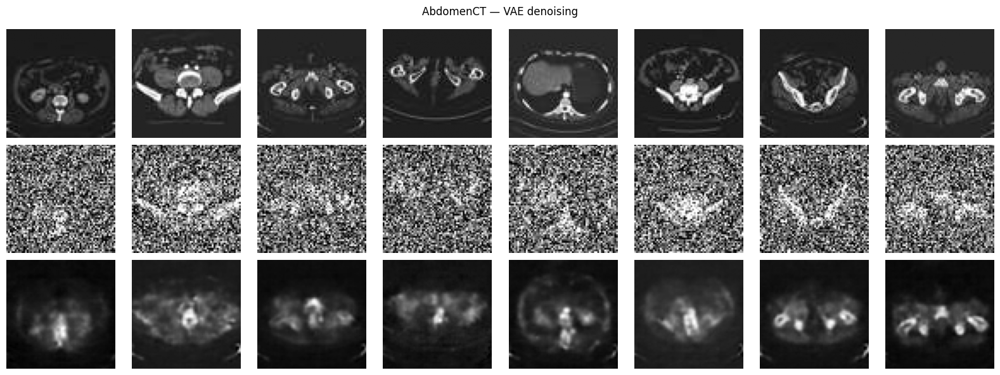

In [7]:
ae_abdomen, vae_abdomen = train_and_visualize('AbdomenCT')

### Region 2 — BreastMRI


========== BreastMRI ==========
[BreastMRI] training AE ...
Epoch 1/20
56/56 - 16s - 286ms/step - loss: 0.3912 - val_loss: 0.2543
Epoch 2/20
56/56 - 9s - 158ms/step - loss: 0.2475 - val_loss: 0.2427
Epoch 3/20
56/56 - 2s - 38ms/step - loss: 0.2230 - val_loss: 0.2099
Epoch 4/20
56/56 - 2s - 38ms/step - loss: 0.2018 - val_loss: 0.1946
Epoch 5/20
56/56 - 2s - 34ms/step - loss: 0.1878 - val_loss: 0.1834
Epoch 6/20
56/56 - 2s - 34ms/step - loss: 0.1803 - val_loss: 0.1780
Epoch 7/20
56/56 - 2s - 34ms/step - loss: 0.1756 - val_loss: 0.1741
Epoch 8/20
56/56 - 2s - 34ms/step - loss: 0.1726 - val_loss: 0.1715
Epoch 9/20
56/56 - 2s - 42ms/step - loss: 0.1699 - val_loss: 0.1697
Epoch 10/20
56/56 - 2s - 37ms/step - loss: 0.1683 - val_loss: 0.1685
Epoch 11/20
56/56 - 2s - 35ms/step - loss: 0.1669 - val_loss: 0.1667
Epoch 12/20
56/56 - 2s - 33ms/step - loss: 0.1656 - val_loss: 0.1657
Epoch 13/20
56/56 - 2s - 33ms/step - loss: 0.1650 - val_loss: 0.1654
Epoch 14/20
56/56 - 2s - 34ms/step - loss: 0.164

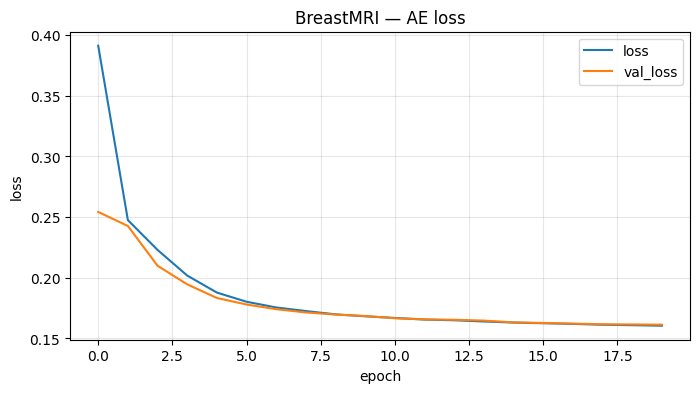

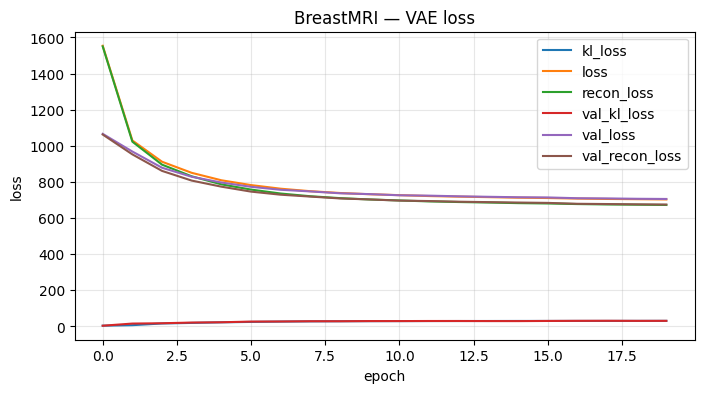

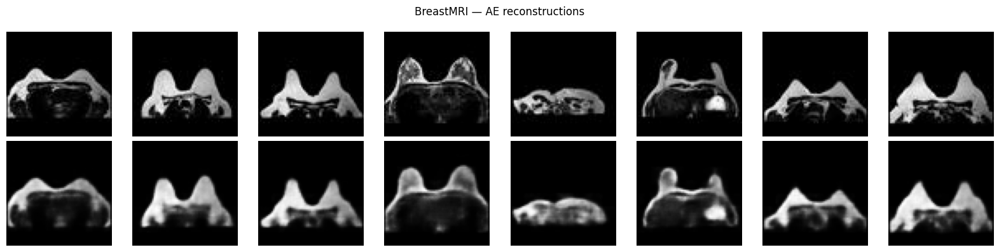

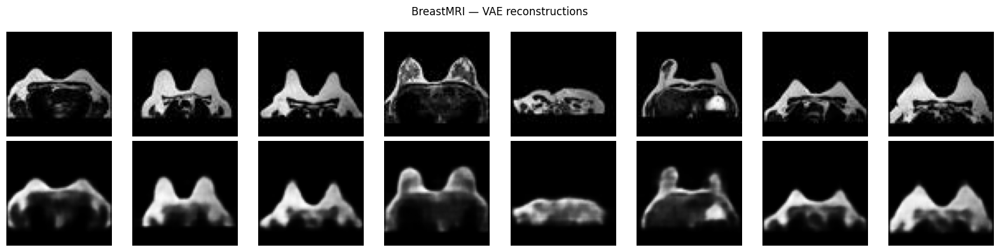

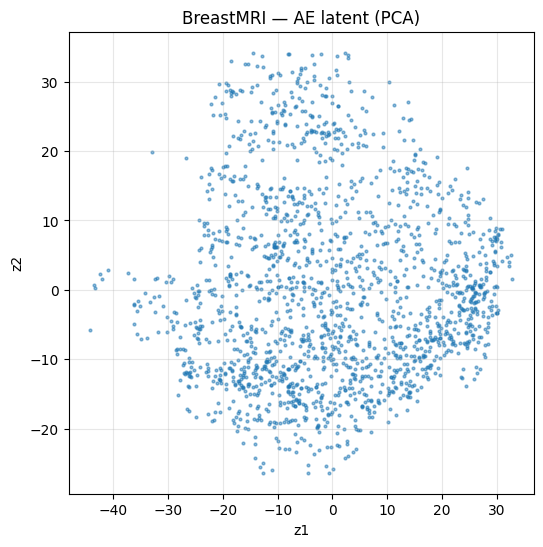

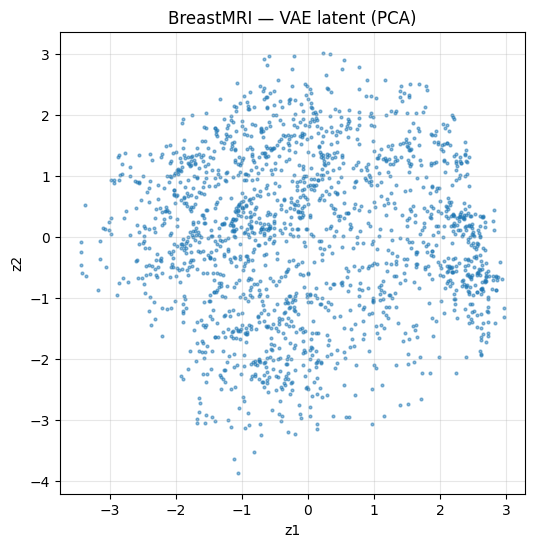

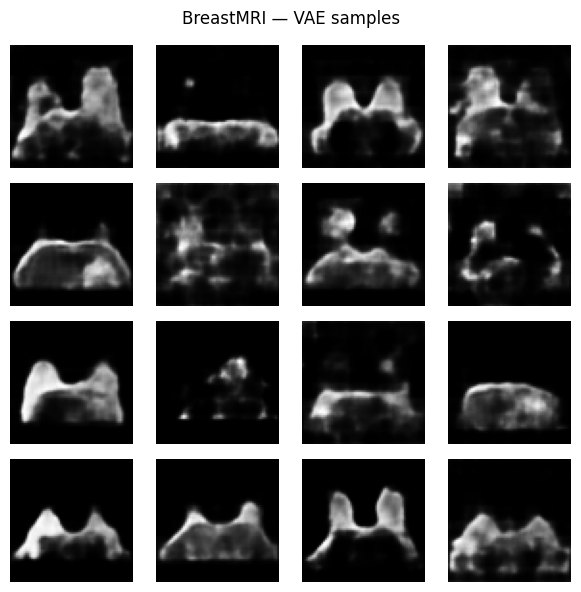

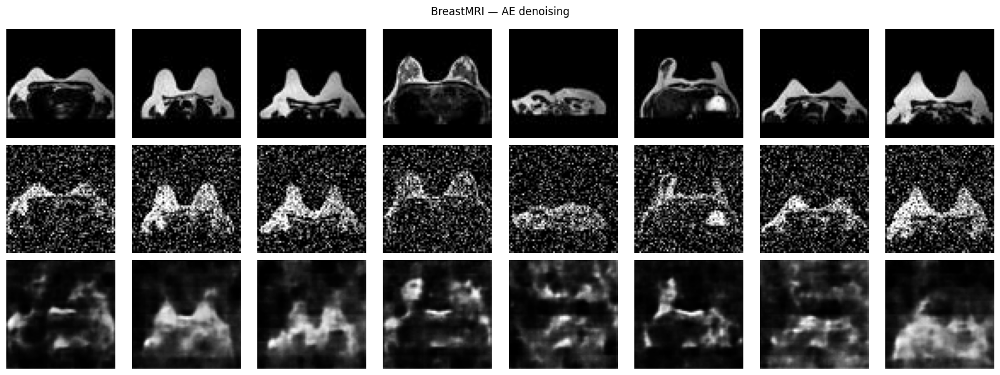

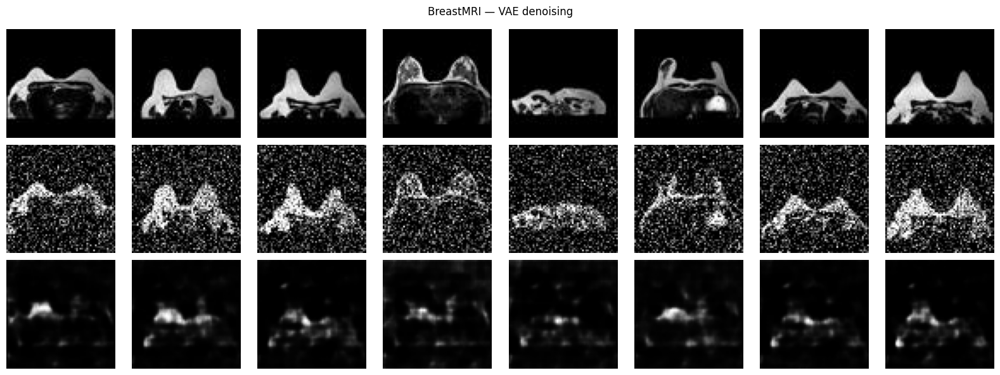

In [8]:
ae_breast, vae_breast = train_and_visualize('BreastMRI')

### Region 3 — ChestCT


========== ChestCT ==========
[ChestCT] training AE ...
Epoch 1/20
63/63 - 10s - 164ms/step - loss: 0.6927 - val_loss: 0.6921
Epoch 2/20
63/63 - 3s - 41ms/step - loss: 0.6921 - val_loss: 0.6921
Epoch 3/20
63/63 - 2s - 34ms/step - loss: 0.6921 - val_loss: 0.6920
Epoch 4/20
63/63 - 2s - 34ms/step - loss: 0.6918 - val_loss: 0.6915
Epoch 5/20
63/63 - 2s - 34ms/step - loss: 0.6914 - val_loss: 0.6912
Epoch 6/20
63/63 - 2s - 33ms/step - loss: 0.6911 - val_loss: 0.6910
Epoch 7/20
63/63 - 2s - 36ms/step - loss: 0.6910 - val_loss: 0.6908
Epoch 8/20
63/63 - 2s - 36ms/step - loss: 0.6908 - val_loss: 0.6907
Epoch 9/20
63/63 - 2s - 35ms/step - loss: 0.6906 - val_loss: 0.6905
Epoch 10/20
63/63 - 2s - 33ms/step - loss: 0.6905 - val_loss: 0.6904
Epoch 11/20
63/63 - 3s - 40ms/step - loss: 0.6904 - val_loss: 0.6903
Epoch 12/20
63/63 - 3s - 41ms/step - loss: 0.6903 - val_loss: 0.6902
Epoch 13/20
63/63 - 2s - 37ms/step - loss: 0.6901 - val_loss: 0.6901
Epoch 14/20
63/63 - 2s - 36ms/step - loss: 0.6900 - v

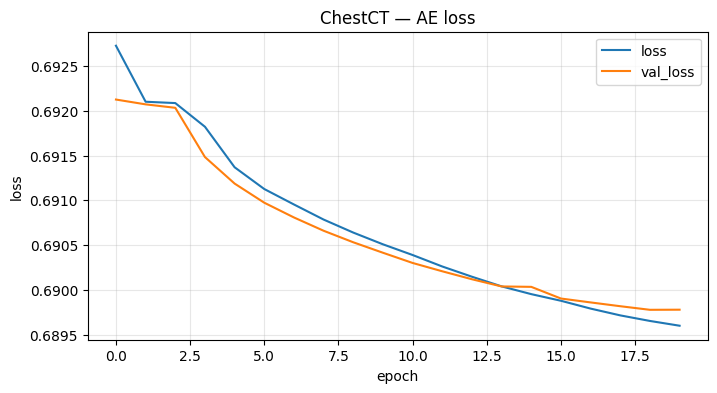

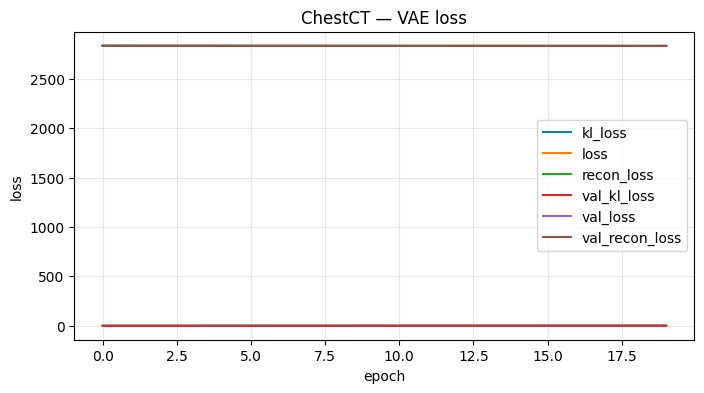

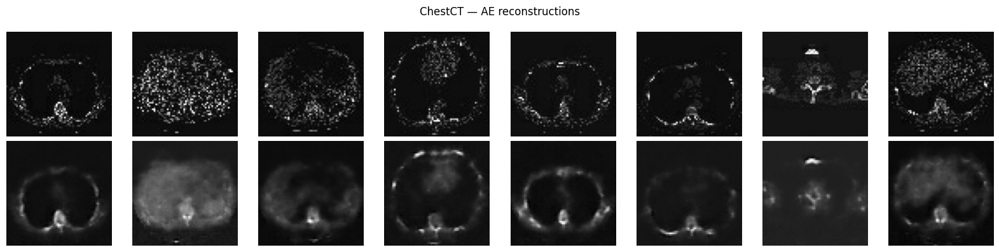

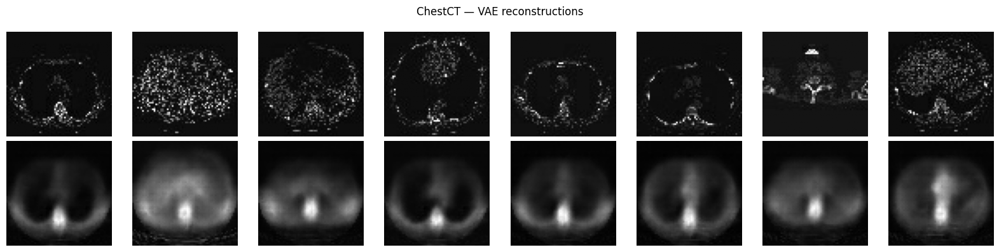

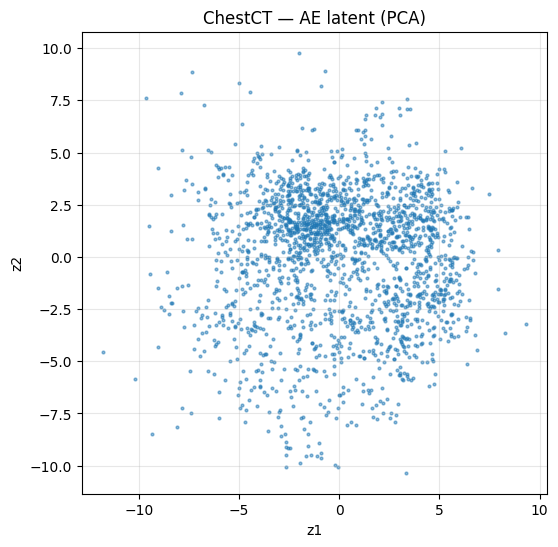

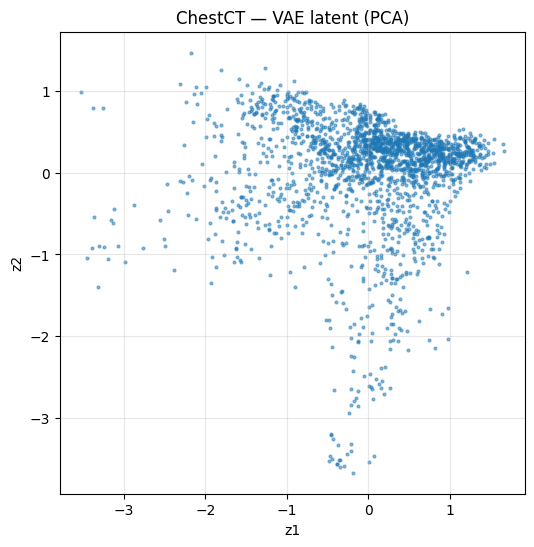

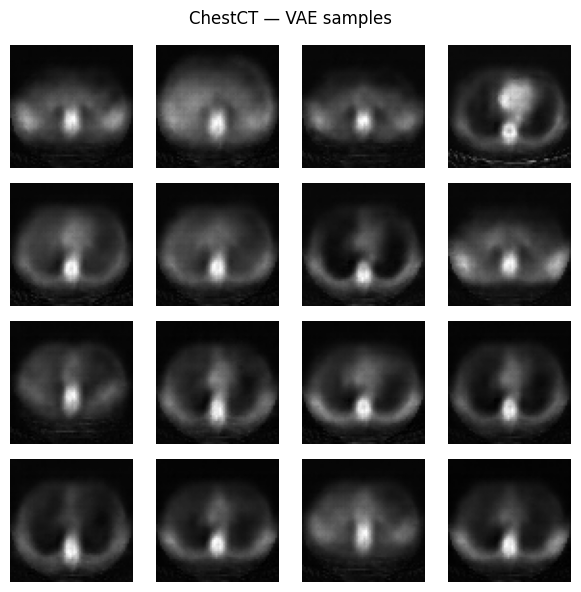

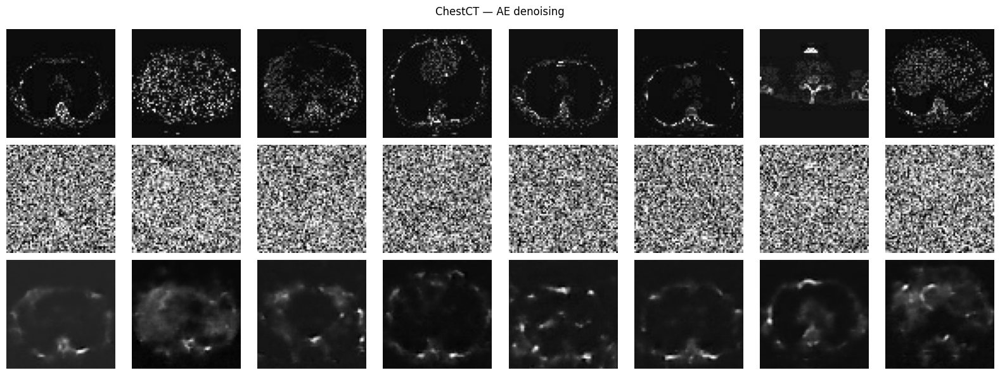

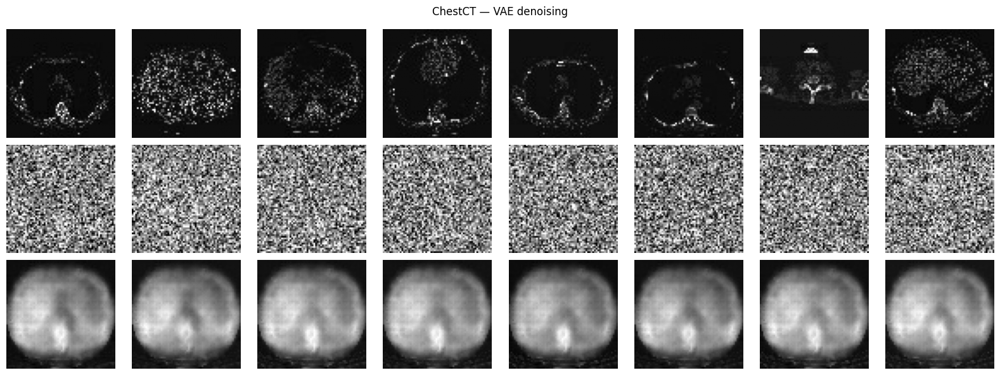

In [9]:
ae_chest, vae_chest = train_and_visualize('ChestCT')

### Region 4 — CXR


========== CXR ==========
[CXR] training AE ...
Epoch 1/20
63/63 - 11s - 177ms/step - loss: 0.6127 - val_loss: 0.5648
Epoch 2/20
63/63 - 2s - 34ms/step - loss: 0.5289 - val_loss: 0.5089
Epoch 3/20
63/63 - 2s - 34ms/step - loss: 0.5041 - val_loss: 0.4984
Epoch 4/20
63/63 - 2s - 34ms/step - loss: 0.4964 - val_loss: 0.4941
Epoch 5/20
63/63 - 2s - 36ms/step - loss: 0.4920 - val_loss: 0.4896
Epoch 6/20
63/63 - 2s - 37ms/step - loss: 0.4896 - val_loss: 0.4881
Epoch 7/20
63/63 - 2s - 36ms/step - loss: 0.4878 - val_loss: 0.4867
Epoch 8/20
63/63 - 2s - 34ms/step - loss: 0.4864 - val_loss: 0.4855
Epoch 9/20
63/63 - 2s - 34ms/step - loss: 0.4852 - val_loss: 0.4847
Epoch 10/20
63/63 - 2s - 34ms/step - loss: 0.4846 - val_loss: 0.4846
Epoch 11/20
63/63 - 2s - 35ms/step - loss: 0.4837 - val_loss: 0.4842
Epoch 12/20
63/63 - 2s - 37ms/step - loss: 0.4834 - val_loss: 0.4838
Epoch 13/20
63/63 - 2s - 36ms/step - loss: 0.4830 - val_loss: 0.4837
Epoch 14/20
63/63 - 2s - 36ms/step - loss: 0.4828 - val_loss:

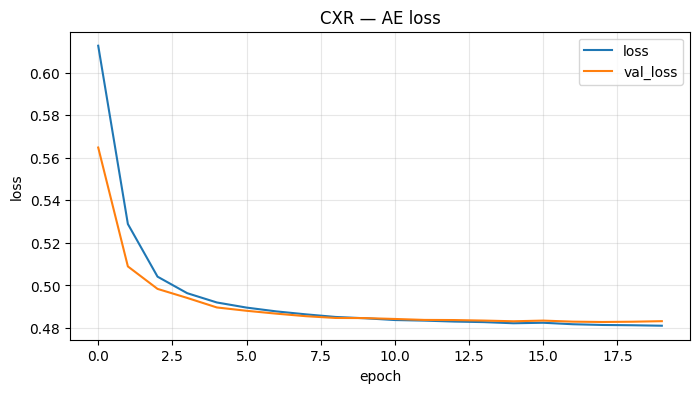

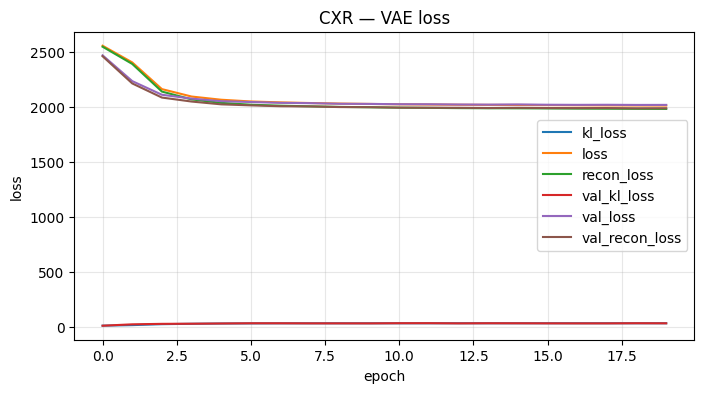

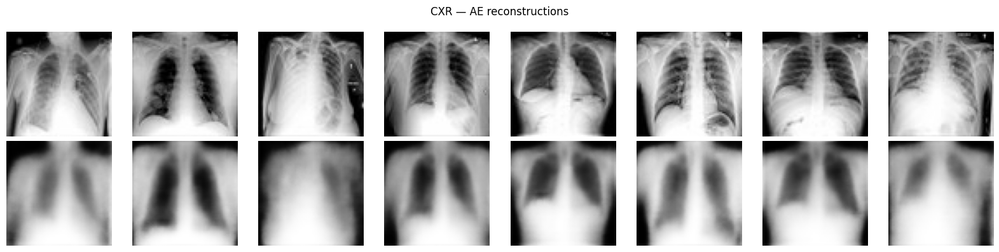

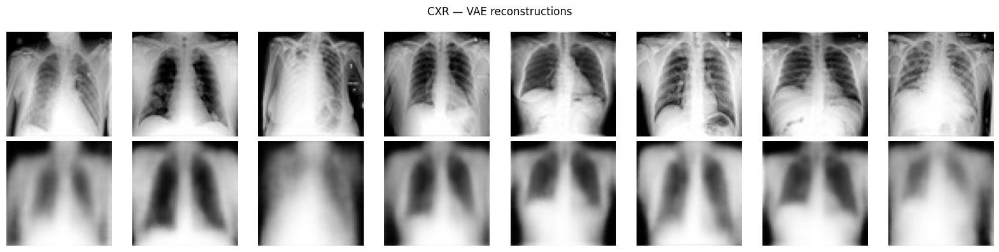

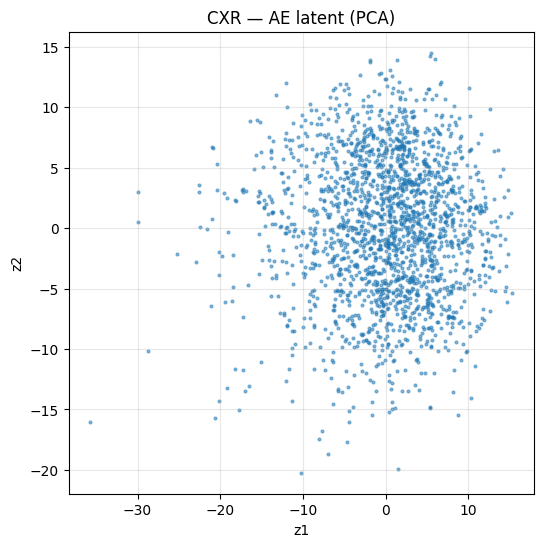

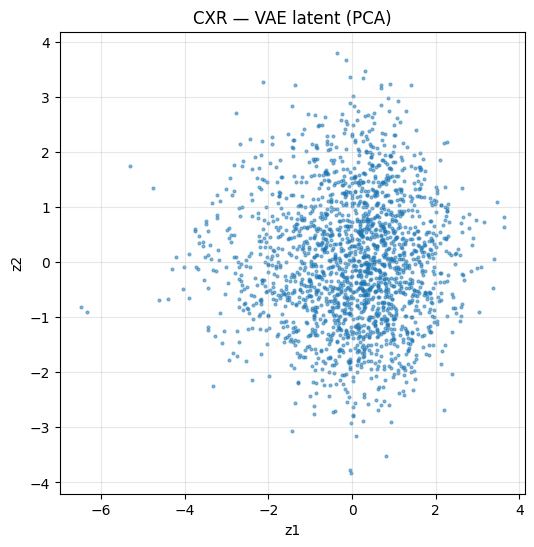

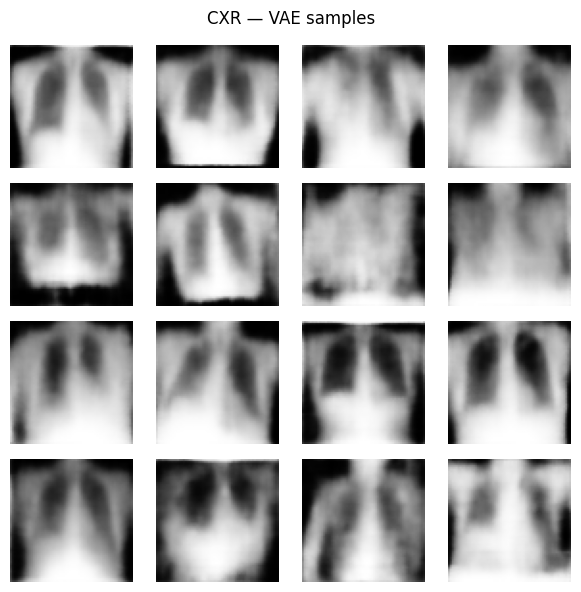

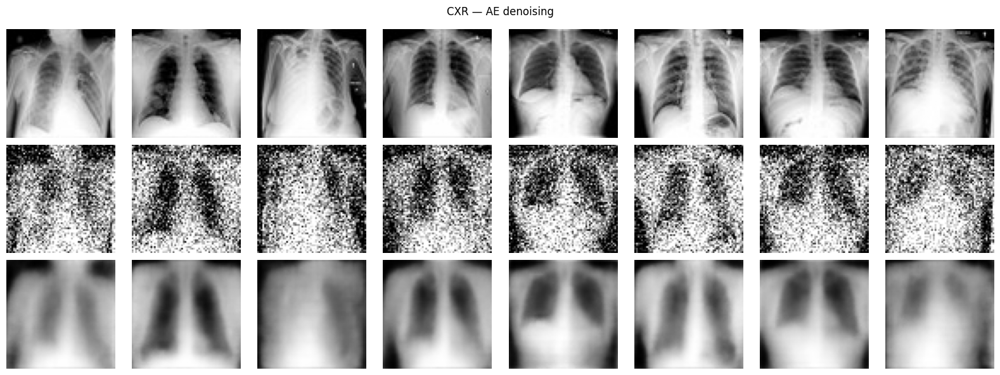

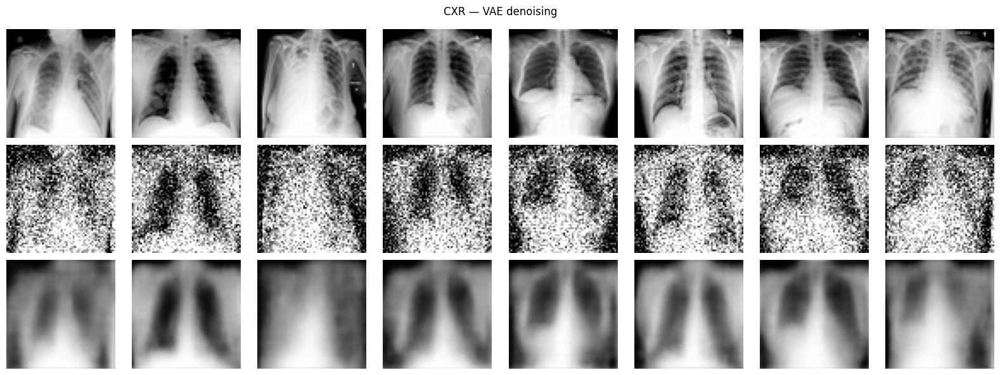

In [10]:
ae_cxr, vae_cxr = train_and_visualize('CXR')

### Region 5 — Hand


========== Hand ==========
[Hand] training AE ...
Epoch 1/20
63/63 - 11s - 181ms/step - loss: 0.5259 - val_loss: 0.4193
Epoch 2/20
63/63 - 2s - 34ms/step - loss: 0.4038 - val_loss: 0.3850
Epoch 3/20
63/63 - 2s - 34ms/step - loss: 0.3732 - val_loss: 0.3657
Epoch 4/20
63/63 - 2s - 36ms/step - loss: 0.3595 - val_loss: 0.3572
Epoch 5/20
63/63 - 2s - 34ms/step - loss: 0.3519 - val_loss: 0.3508
Epoch 6/20
63/63 - 3s - 43ms/step - loss: 0.3467 - val_loss: 0.3460
Epoch 7/20
63/63 - 2s - 35ms/step - loss: 0.3421 - val_loss: 0.3429
Epoch 8/20
63/63 - 2s - 35ms/step - loss: 0.3394 - val_loss: 0.3405
Epoch 9/20
63/63 - 2s - 35ms/step - loss: 0.3374 - val_loss: 0.3389
Epoch 10/20
63/63 - 2s - 36ms/step - loss: 0.3358 - val_loss: 0.3382
Epoch 11/20
63/63 - 2s - 35ms/step - loss: 0.3346 - val_loss: 0.3373
Epoch 12/20
63/63 - 2s - 38ms/step - loss: 0.3337 - val_loss: 0.3363
Epoch 13/20
63/63 - 2s - 38ms/step - loss: 0.3328 - val_loss: 0.3359
Epoch 14/20
63/63 - 2s - 37ms/step - loss: 0.3322 - val_los

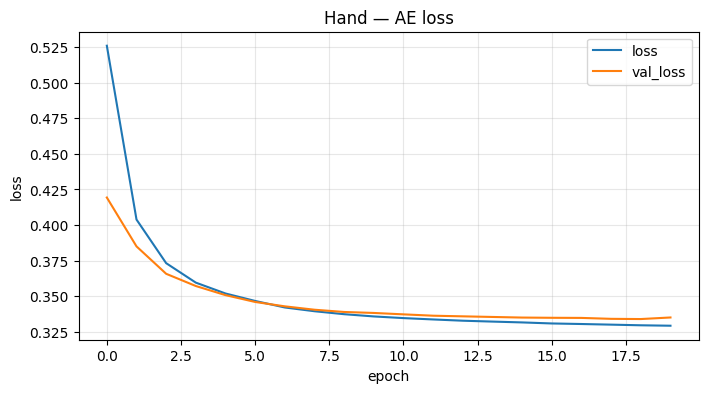

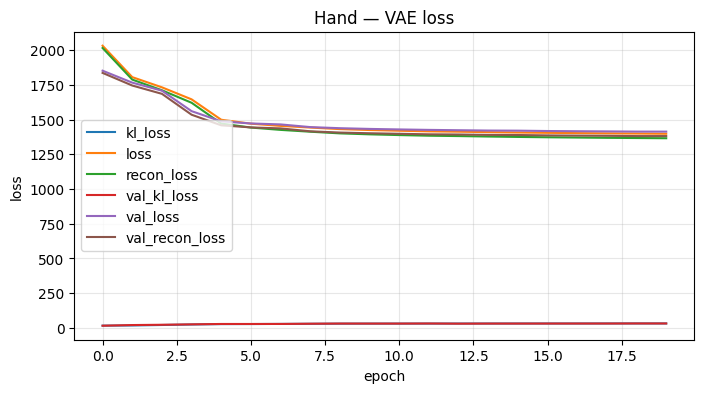

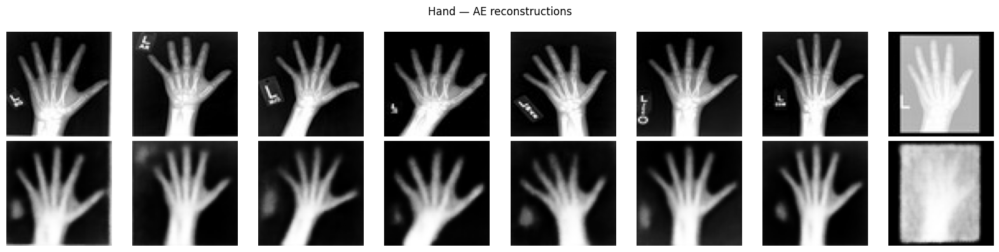

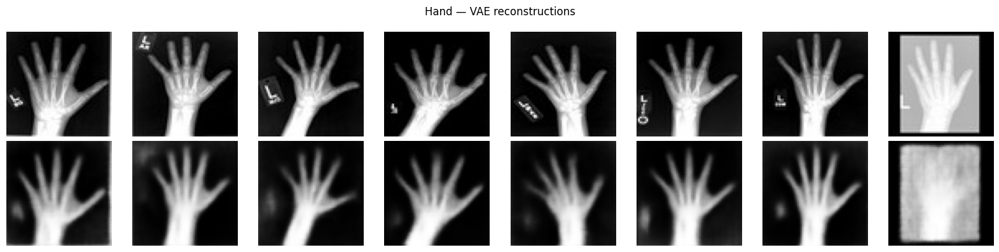

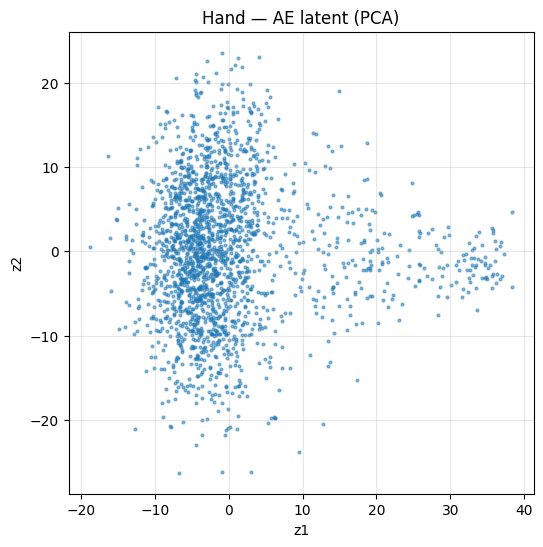

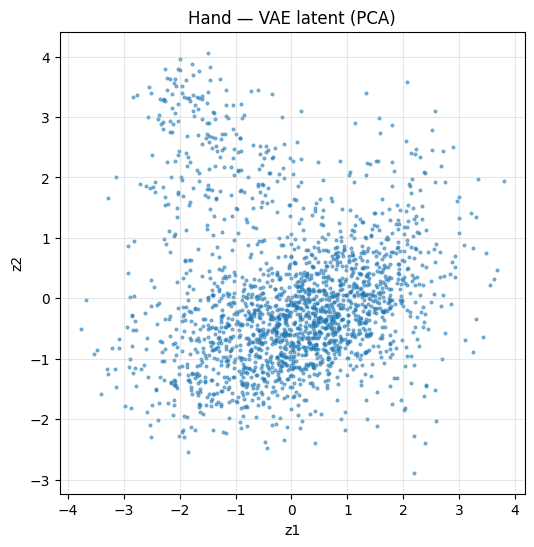

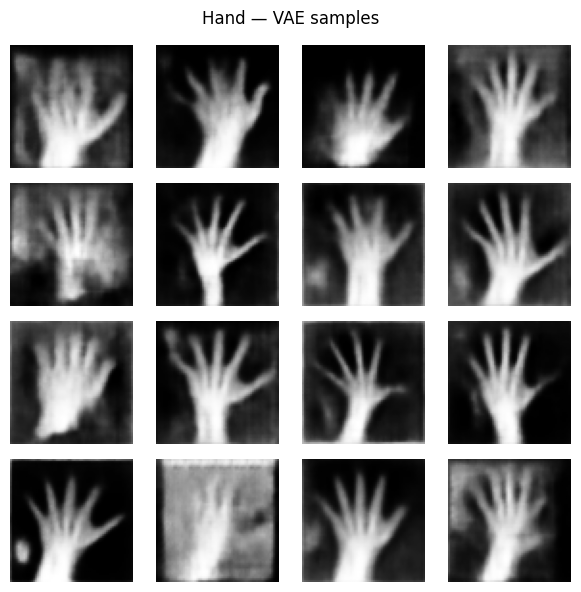

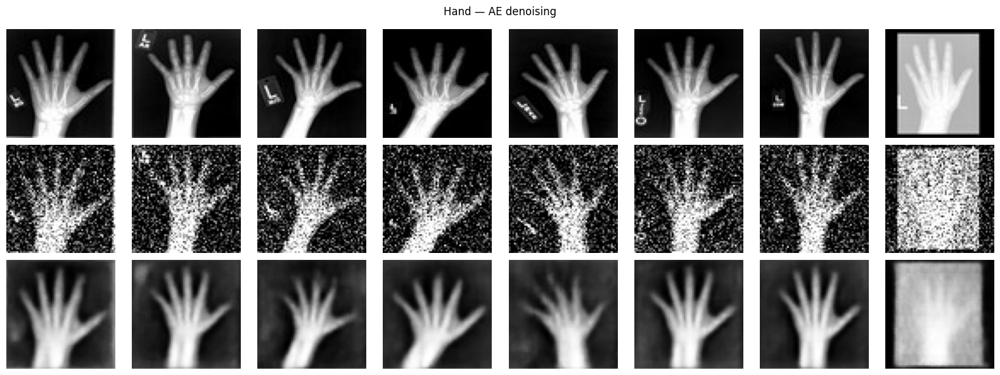

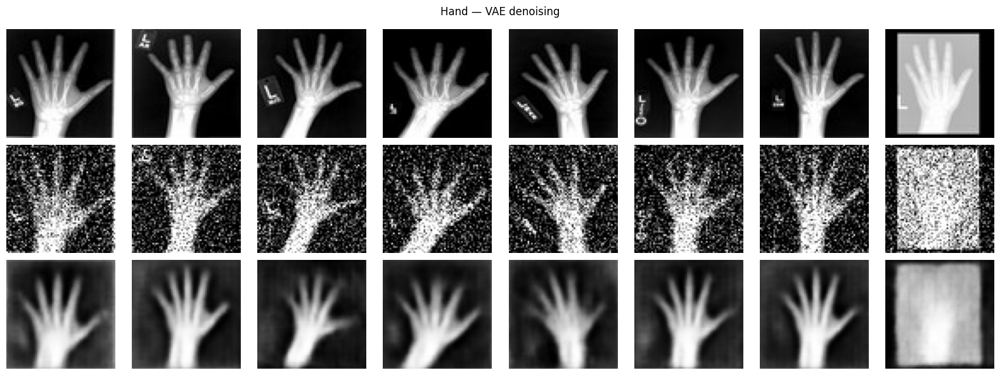

In [11]:
ae_hand, vae_hand = train_and_visualize('Hand')

### Region 6 — HeadCT


========== HeadCT ==========
[HeadCT] training AE ...
Epoch 1/20
63/63 - 11s - 176ms/step - loss: 0.5291 - val_loss: 0.4748
Epoch 2/20
63/63 - 2s - 34ms/step - loss: 0.4672 - val_loss: 0.4522
Epoch 3/20
63/63 - 2s - 34ms/step - loss: 0.4345 - val_loss: 0.4263
Epoch 4/20
63/63 - 2s - 34ms/step - loss: 0.4201 - val_loss: 0.4185
Epoch 5/20
63/63 - 2s - 34ms/step - loss: 0.4140 - val_loss: 0.4136
Epoch 6/20
63/63 - 3s - 41ms/step - loss: 0.4098 - val_loss: 0.4106
Epoch 7/20
63/63 - 2s - 38ms/step - loss: 0.4072 - val_loss: 0.4081
Epoch 8/20
63/63 - 2s - 35ms/step - loss: 0.4051 - val_loss: 0.4066
Epoch 9/20
63/63 - 2s - 34ms/step - loss: 0.4037 - val_loss: 0.4058
Epoch 10/20
63/63 - 2s - 34ms/step - loss: 0.4027 - val_loss: 0.4046
Epoch 11/20
63/63 - 2s - 35ms/step - loss: 0.4018 - val_loss: 0.4039
Epoch 12/20
63/63 - 2s - 35ms/step - loss: 0.4011 - val_loss: 0.4040
Epoch 13/20
63/63 - 3s - 43ms/step - loss: 0.4003 - val_loss: 0.4028
Epoch 14/20
63/63 - 2s - 36ms/step - loss: 0.3997 - val

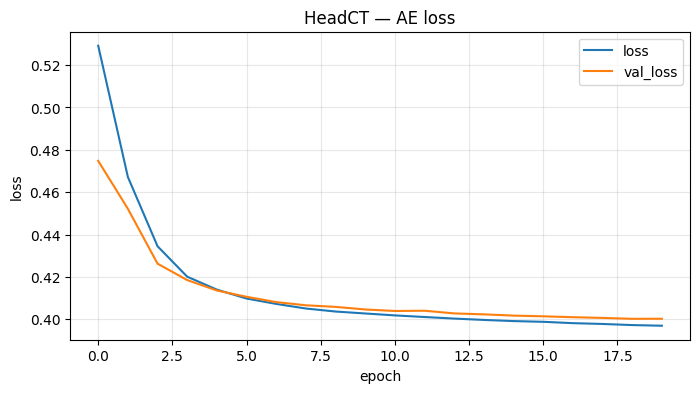

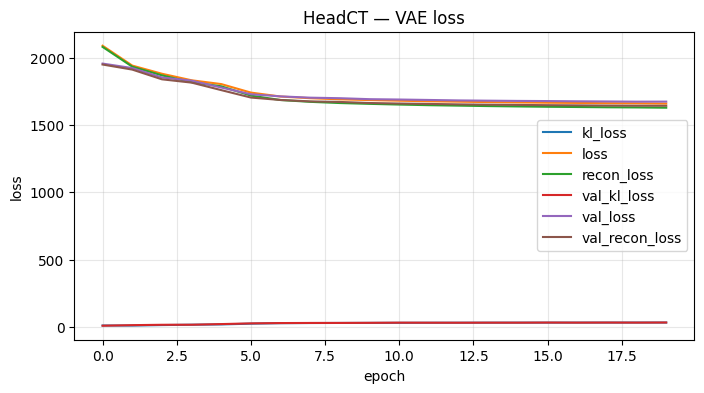

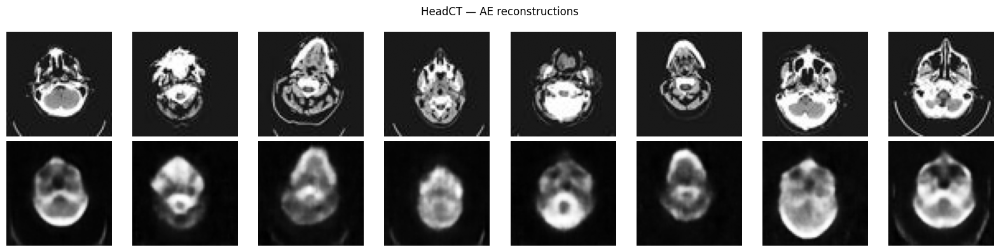

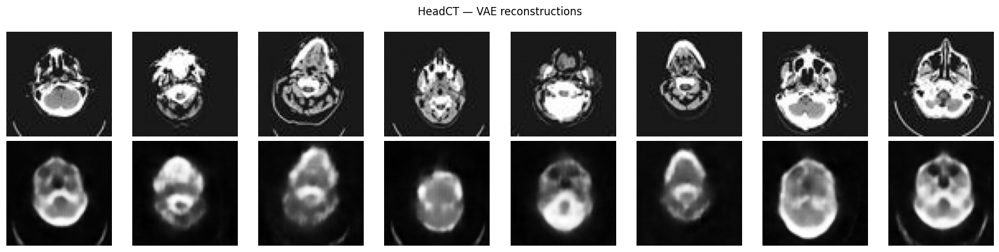

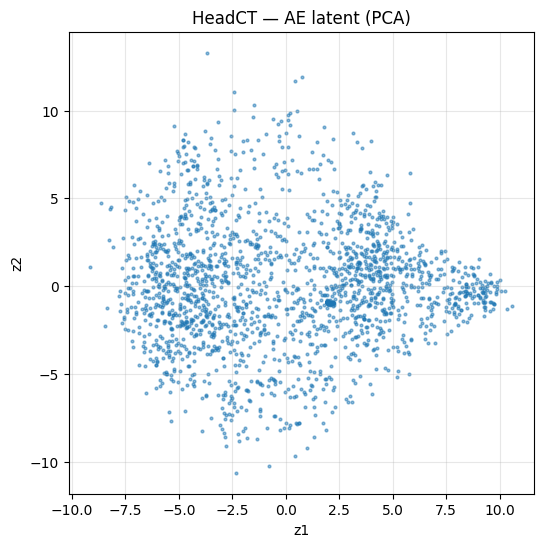

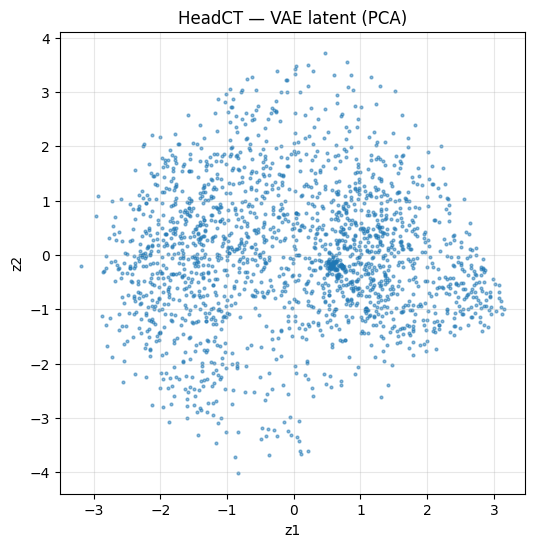

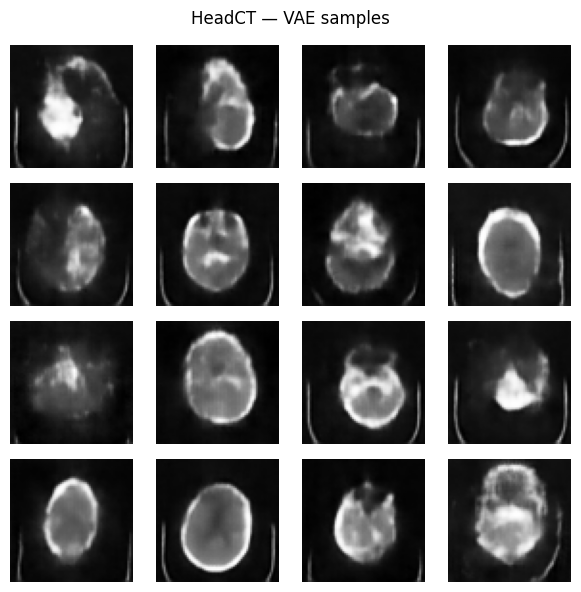

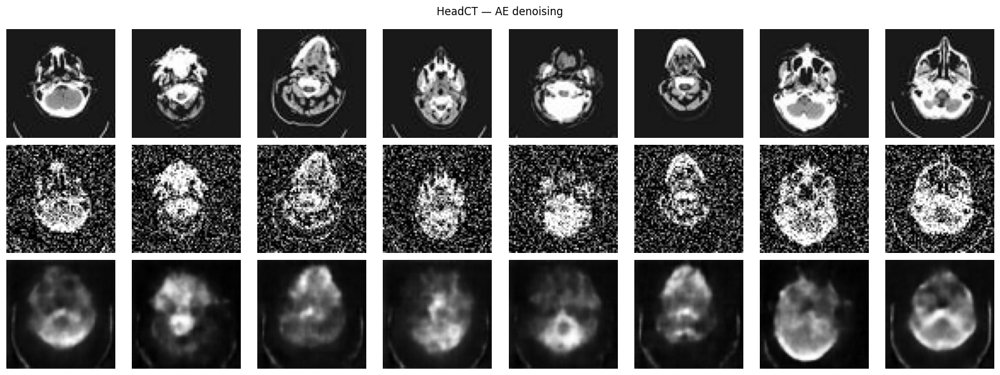

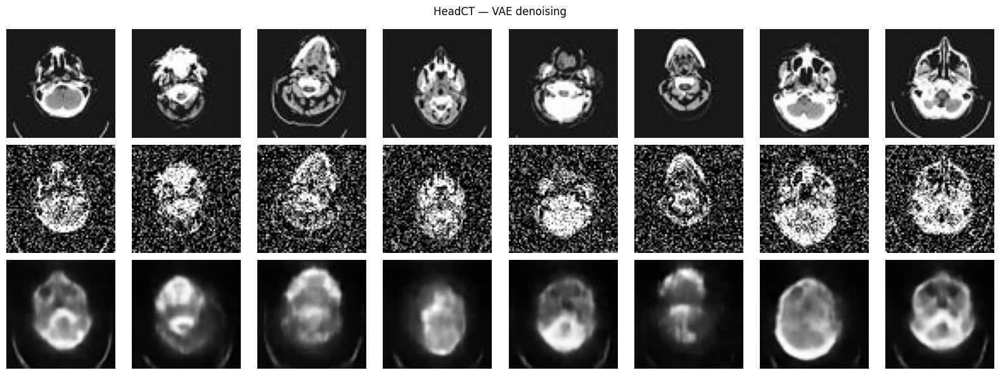

In [12]:
ae_head, vae_head = train_and_visualize('HeadCT')

## 7. Summary table

In [13]:
print(f"{'region':<12} {'AE val_loss':>14} {'VAE val_loss':>14} {'VAE recon':>12} {'VAE KL':>10}")
print('-' * 64)
for region, r in results.items():
    print(f"{region:<12} {r['ae_val_loss']:>14.4f} {r['vae_val_loss']:>14.4f} "
          f"{r['vae_val_recon']:>12.4f} {r['vae_val_kl']:>10.4f}")

region          AE val_loss   VAE val_loss    VAE recon     VAE KL
----------------------------------------------------------------
AbdomenCT            0.6675      2757.4390    2747.5671     9.8720
BreastMRI            0.1613       705.6749     674.8627    30.8123
ChestCT              0.6898      2834.3438    2833.1919     1.1518
CXR                  0.4832      2017.7661    1987.4130    30.3529
Hand                 0.3351      1412.9377    1380.8654    32.0724
HeadCT               0.4002      1675.5183    1644.5173    31.0007
